In [11]:
import numpy as np
from pydub import AudioSegment
import librosa 
import random
import sys
import io
import os
import glob
import IPython.display as ipd
import matplotlib.pyplot as plt
from scipy.io import wavfile
from sklearn.preprocessing import LabelEncoder
from keras.utils import np_utils
from sklearn.model_selection import train_test_split
%matplotlib inline

C:\Users\Sanjeev\Anaconda3\envs\convo\lib\site-packages\pydub\utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


## Click here to download the dataset  [URL](https://www.kaggle.com/c/tensorflow-speech-recognition-challenge/data)

Data Exploration and Visualization

In [2]:
train_audio_path = './XY_train/train/audio/'

In [3]:
ipd.Audio(train_audio_path + "happy/0ab3b47d_nohash_0.wav")


In [4]:
ipd.Audio(train_audio_path + "_background_noise_/doing_the_dishes.wav")

In [5]:
ipd.Audio(train_audio_path + "/five/00b01445_nohash_0.wav")

In [6]:
ipd.Audio("./raw_data/negatives/1.wav")

In [7]:
ipd.Audio("audio_examples/example_train.wav")

Load a wav file

In [8]:
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    return rate, data

Calculate and plot spectrogram for a wav audio file

It’s a 2D plot between time and frequency where each point in the plot represents the amplitude of a particular frequency at a particular time in terms of intensity of color

In simple terms, the spectrogram is a spectrum (broad range of colors) of frequencies as it varies with time. 

In [9]:
def graph_spectrogram(wav_file):
    rate, data = get_wav_info(wav_file)
    # Length of each window segment
    nfft = 200 
    # Sampling frequencies
    fs = 8000 
    # Overlap between windows
    noverlap = 120 
    nchannels = data.ndim
    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap)
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap)
    return pxx

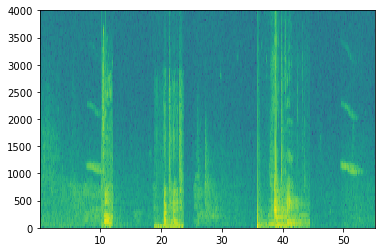

In [10]:
x = graph_spectrogram("audio_examples/example_train.wav")

In [11]:
_, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


In [12]:
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

In [13]:
Ty = 1375 # The number of time steps in the output of our model

In [14]:
def load_raw_audio():
    activates = []
    backgrounds = []
    negatives = []
    for filename in os.listdir("./raw_data/activates"):
        if filename.endswith("wav"):
            activate = AudioSegment.from_wav("./raw_data/activates/"+filename)
            activates.append(activate)
    for filename in os.listdir("./raw_data/backgrounds"):
        if filename.endswith("wav"):
            background = AudioSegment.from_wav("./raw_data/backgrounds/"+filename)
            backgrounds.append(background)
    for filename in os.listdir("./raw_data/negatives"):
        if filename.endswith("wav"):
            negative = AudioSegment.from_wav("./raw_data/negatives/"+filename)
            negatives.append(negative)
    return activates, negatives, backgrounds

In [15]:
# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio()

print("background len should be 10,000, since it is a 10 sec clip\n" + str(len(backgrounds[0])),"\n")
print("activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) \n" + str(len(activates[0])),"\n")
print("activate[1] len: different `activate` clips can have different lengths\n" + str(len(activates[1])),"\n")

background len should be 10,000, since it is a 10 sec clip
10000 

activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) 
721 

activate[1] len: different `activate` clips can have different lengths
731 



Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.

segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")

Returns:
segment_time -- a tuple of (segment_start, segment_end) in ms


In [16]:
def get_random_time_segment(segment_ms):
    segment_start = np.random.randint(low=0, high=10000-segment_ms)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    return (segment_start, segment_end)

Checks if the time of a segment overlaps with the times of existing segments.
segment_time -- a tuple of (segment_start, segment_end) for the new segment
previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments

Returns:
True if the time segment overlaps with any of the existing segments, False otherwise

In [17]:
def is_overlapping(segment_time, previous_segments):
    segment_start, segment_end = segment_time
    #Initialize overlap as a "False" flag.
    overlap = False
    #loop over the previous_segments start and end times.
    # Compare start/end times and set the flag to True if there is an overlap (≈ 3 lines)
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start:
            overlap = True
    return overlap

In [18]:
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2305), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  True



Insert a new audio segment over the background noise at a random time step, ensuring that the 
audio segment does not overlap with existing segments.

Arguments:
background -- a 10 second background audio recording.  
audio_clip -- the audio clip to be inserted/overlaid. 
previous_segments -- times where audio segments have already been placed

Returns:
new_background -- the updated background audio


In [19]:
def insert_audio_clip(background, audio_clip, previous_segments):
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)
    #Use one of the helper functions to pick a random time segment onto which to insert 
    # the new audio clip.
    segment_time = get_random_time_segment(segment_ms)
    #check if the new segment_time overlaps with one of the previous_segments. If so, keep picking new segment_time at random until it doesn't overlap.
    while is_overlapping(segment_time, previous_segments):
        segment_time = get_random_time_segment(segment_ms)
    #Add the new segment_time to the list of previous_segments
    previous_segments.append(segment_time)
    #Superpose audio segment and background
    new_background = background.overlay(audio_clip, position = segment_time[0])
    
    return new_background, segment_time

In [20]:
np.random.seed(5)
audio_clip, segment_time = insert_audio_clip(backgrounds[0], activates[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
ipd.Audio("insert_test.wav")

Segment Time:  (2915, 3635)


In [21]:
# Expected audio
ipd.Audio("audio_examples/insert_reference.wav")

Used to standardize volume of audio clip

In [22]:
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)


Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
50 following labels should be ones.


Arguments:
y -- numpy array of shape (1, Ty), the labels of the training example
segment_end_ms -- the end time of the segment in ms

Returns:
y -- updated labels


In [23]:
def insert_ones(y, segment_end_ms):
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    # Add 1 to the correct index in the background label (y)
    for i in range(segment_end_y + 1, segment_end_y + 51):
        if i < Ty:
            y[0, i] = 1
    return y

sanity checks: 0.0 1.0 0.0


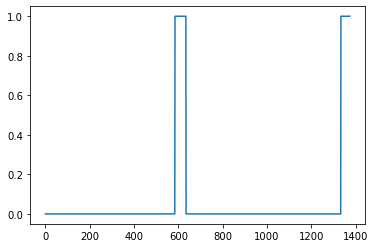

In [24]:
arr1 = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(arr1, 4251)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])


Creates a training example with a given background, activates, and negatives.

Arguments:
background -- a 10 second background audio recording
activates -- a list of audio segments of the word "activate"
negatives -- a list of audio segments of random words that are not "activate"

Returns:
x -- the spectrogram of the training example
y -- the label at each time step of the spectrogram


In [25]:
def create_training_example(background, activates, negatives):
    # Set the random seed
    np.random.seed(18)
    # Make background quieter
    background = background - 20
    #Initialize y (label vector) of zeros
    y = np.zeros((1, Ty))
    #Initialize segment times as empty list
    previous_segments = []
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    #Loop over randomly selected "activate" clips and insert in background
    for random_activate in random_activates:
        # Insert the audio clip on the background
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        # Insert labels in "y"
        y = insert_ones(y, segment_end_ms=segment_end)
    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]
    #Loop over randomly selected negative clips and insert in background
    for random_negative in random_negatives:
        # Insert the audio clip on the background 
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)
    # Export new training example 
    file_handle = background.export("train" + ".wav", format="wav")
    print("File (train.wav) was saved in your directory.")
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")
    return x, y

File (train.wav) was saved in your directory.


C:\Users\Sanjeev\Anaconda3\envs\convo\lib\site-packages\matplotlib\axes\_axes.py:7747: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


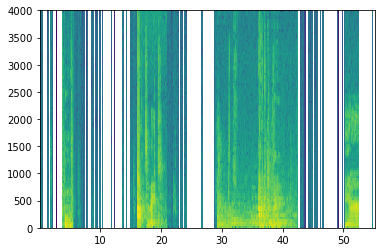

In [26]:
x, y = create_training_example(backgrounds[0], activates, negatives)

In [27]:
ipd.Audio("train.wav")

In [28]:
ipd.Audio("audio_examples/train_reference.wav")

Finally, you can plot the associated labels for the generated training example.

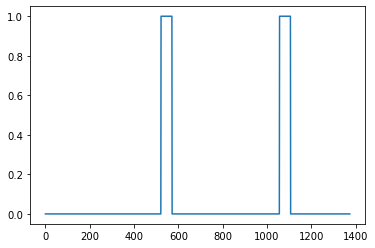

In [29]:
plt.plot(y[0])

### train on dataset

In [30]:
train_audio_path = './XY_train/train/audio/'
labels=os.listdir(train_audio_path)
labels


['bed',
 'bird',
 'cat',
 'dog',
 'down',
 'eight',
 'five',
 'four',
 'go',
 'happy',
 'house',
 'left',
 'marvin',
 'nine',
 'no',
 'off',
 'on',
 'one',
 'right',
 'seven',
 'sheila',
 'six',
 'stop',
 'three',
 'tree',
 'two',
 'up',
 'wow',
 'yes',
 'zero',
 '_background_noise_']

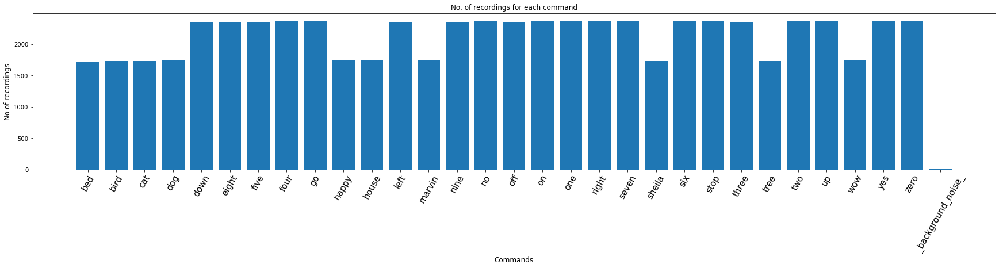

In [31]:
#find count of each label and plot bar graph
no_of_recordings=[]
for label in labels:
    waves = [f for f in os.listdir(train_audio_path + '/'+ label) if f.endswith('.wav')]
    no_of_recordings.append(len(waves))
    
#plot
plt.figure(figsize=(30,5))
index = np.arange(len(labels))
plt.bar(index, no_of_recordings)
plt.xlabel('Commands', fontsize=12)
plt.ylabel('No of recordings', fontsize=12)
plt.xticks(index, labels, fontsize=15, rotation=60)
plt.title('No. of recordings for each command')
plt.show()

In [32]:
labels=["yes", "no", "up", "down", "happy", "house"]
all_wave = []
all_label = []
for label in labels:
    print(label)
    waves = [f for f in os.listdir(train_audio_path + '/'+ label) if f.endswith('.wav')]
    for wav in waves:
        samples, sample_rate = librosa.load(train_audio_path + '/' + label + '/' + wav, sr = 16000)
        samples = librosa.resample(samples, sample_rate, 8000)
        if(len(samples)== 8000) : 
            all_wave.append(samples)
            all_label.append(label)

yes
no
up
down
happy
house


In [33]:
le = LabelEncoder()
y=le.fit_transform(all_label)
classes= list(le.classes_)

In [34]:
y=np_utils.to_categorical(y, num_classes=len(labels))

In [35]:
all_wave = np.array(all_wave).reshape(-1,8000,1)

In [36]:

X_train, X_val, Y_train, Y_val = train_test_split(np.array(all_wave),np.array(y),stratify=y,test_size = 0.2,random_state=143,shuffle=True)

In [37]:
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D,MaxPooling1D
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape,Flatten
from keras.optimizers import Adam
from keras import backend as K
K.clear_session()


Function creating the model's graph in Keras.

Argument:
input_shape -- shape of the model's input data (using Keras conventions)

Returns:
model -- Keras model instance


In [48]:
def model_needimprovement(input_shape):
    
    X_input = Input(shape = input_shape)
    #CONV layer
    #X = Conv1D(8,13, padding='valid', activation='relu', strides=1)(inputs)  
    X = Conv1D(196, kernel_size=15, strides=4)(X_input)
    X = BatchNormalization()(X)                                 
    X = Activation('relu')(X)                                 
    X = Dropout(0.8)(X)                                

    #First GRU Layer GRU (use 128 units and return the sequences)
    X = GRU(units = 128, return_sequences = True)(X) 
    X = Dropout(0.8)(X)                                
    X = BatchNormalization()(X)                                 
    
    #Second GRU Layer
    X = GRU(units = 128, return_sequences = True)(X)   
    X = Dropout(0.8)(X)                                 
    X = BatchNormalization()(X)                                 
    X = Dropout(0.8)(X)                                  
    
    #Time-distributed dense layer
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X)
    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [68]:
def model(input_shape):
    #First Conv1D layer
    X_input = Input(shape = input_shape)
    X = Conv1D(8,13, padding='valid', activation='relu', strides=1)(X_input)
    X = MaxPooling1D(3)(X)
    X = Activation('relu')(X)  
    X = Dropout(0.3)(X)

    #Second Conv1D layer
    X = Conv1D(16, 11, padding='valid', activation='relu', strides=1)(X)
    X = MaxPooling1D(3)(X)
    X = Activation('relu')(X)  
    X = Dropout(0.3)(X)
    
    #First GRU Layer GRU (use 128 units and return the sequences)
    X = GRU(units = 128, return_sequences = True)(X) 
    X = Dropout(0.8)(X)                                
    X = BatchNormalization()(X)                                 
    

    #Third Conv1D layer
    X = Conv1D(32, 9, padding='valid', activation='relu', strides=1)(X)
    X = MaxPooling1D(3)(X)
    X = Activation('relu')(X)  
    X = Dropout(0.3)(X)

    #Flatten layer
    X = Flatten()(X)

    #Dense Layer 1
    X = Dense(128, activation='relu')(X)
    X = Dropout(0.3)(X)

    outputs = Dense(len(labels), activation='softmax')(X)

    model = Model(X_input, outputs)
    return model

In [69]:
model=model(input_shape=(8000,1))

In [70]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         (None, 8000, 1)           0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 7988, 8)           112       
_________________________________________________________________
max_pooling1d_19 (MaxPooling (None, 2662, 8)           0         
_________________________________________________________________
activation_11 (Activation)   (None, 2662, 8)           0         
_________________________________________________________________
dropout_41 (Dropout)         (None, 2662, 8)           0         
_________________________________________________________________
conv1d_20 (Conv1D)           (None, 2652, 16)          1424      
_________________________________________________________________
max_pooling1d_20 (MaxPooling (None, 884, 16)           0         
__________

In [71]:
optimizer = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=["accuracy"])

In [72]:
model.fit(X_train, Y_train, batch_size = 5, epochs=1)

Epoch 1/1
9262/9262 [==============================] - 5834s 630ms/step - loss: 0.4533 - acc: 0.8313


In [73]:
earlyStopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10, min_delta=0.0001) 
modelCheckpoint = ModelCheckpoint('Speach_to_Text_model.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='max')

In [ ]:
history=model.fit(X_train, Y_train ,epochs=150, callbacks=[earlyStopping,modelCheckpoint], batch_size=32, validation_data=(X_val,Y_val))

Train on 9262 samples, validate on 2316 samples
Epoch 1/150
9262/9262 [==============================] - 2440s 263ms/step - loss: 0.4424 - acc: 0.8322 - val_loss: 0.4473 - val_acc: 0.8333

Epoch 00001: val_acc improved from -inf to 0.83333, saving model to Speach_to_Text_model.hdf5
Epoch 2/150
9262/9262 [==============================] - 2621s 283ms/step - loss: 0.4414 - acc: 0.8326 - val_loss: 0.4471 - val_acc: 0.8333

Epoch 00002: val_acc did not improve from 0.83333
Epoch 3/150
9262/9262 [==============================] - 2874s 310ms/step - loss: 0.4400 - acc: 0.8322 - val_loss: 0.4469 - val_acc: 0.8333

Epoch 00003: val_acc did not improve from 0.83333
Epoch 4/150
9262/9262 [==============================] - 3153s 340ms/step - loss: 0.4388 - acc: 0.8329 - val_loss: 0.4467 - val_acc: 0.8333

Epoch 00004: val_acc did not improve from 0.83333
Epoch 5/150
 768/9262 [=>............................] - ETA: 46:13 - loss: 0.4361 - acc: 0.8318

In [1]:
from matplotlib import pyplot 
pyplot.plot(history.history['loss'], label='train') 
pyplot.plot(history.history['val_loss'], label='test') 
pyplot.legend() pyplot.show()

SyntaxError: invalid syntax (<ipython-input-1-732f42f4eea8>, line 4)

In [3]:
from keras.models import load_model
model=load_model('Speach_to_Text_model.hdf5')






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




In [4]:
def predict(audio):
    prob=model.predict(audio.reshape(1,8000,1))
    index=np.argmax(prob[0])
    return classes[index]

Record your own voice commands and test it on the model

In [22]:
import sounddevice as sd
import soundfile as sf

samplerate = 16000  
duration = 1 # seconds
filename = 'no2.wav'
print("start")
mydata = sd.rec(int(samplerate * duration), samplerate=samplerate,channels=1, blocking=True)
print("end")
sd.wait()
sf.write(filename, mydata, samplerate)

start
end


In [39]:
#os.listdir('./XY_train/')
filepath='./XY_train/test/audio'

#reading the voice commands
samples, sample_rate = librosa.load(filepath + '/' + 'clip_000ed5715.wav', sr = 16000)
samples = librosa.resample(samples, sample_rate, 8000)
ipd.Audio(samples,rate=8000)  


In [40]:
predict(samples)

NameError: name 'classes' is not defined